In [1]:
# Import necessasry libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import linear_model, metrics
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

# Read CSV file

df=pd.read_csv(r"E:\IIITB AI ML\Sem1\Assignments\House pricing with regularization\Data\train.csv")

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',None)

In [3]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
df.shape

(1460, 81)

In [5]:
df.isna().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [6]:
# replace na value of 'Eelctrical' and 'GarageYrBlt' to mode value, since they are categorical variables

In [7]:
df['Electrical'].fillna(df['Electrical'].mode()[0],inplace=True)

In [8]:
df['Electrical'].isna().sum()

0

In [9]:
df['GarageYrBlt'].fillna(df['GarageYrBlt'].mode()[0],inplace=True)

In [10]:
df['GarageYrBlt'].isna().sum()

0

In [11]:
df['Electrical'].value_counts()

SBrkr    1335
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [12]:
df['GarageYrBlt'].value_counts()

2005.0    146
2006.0     59
2004.0     53
2003.0     50
2007.0     49
1977.0     35
1998.0     31
1999.0     30
1976.0     29
2008.0     29
2000.0     27
1968.0     26
2002.0     26
1950.0     24
1993.0     22
1958.0     21
1966.0     21
2009.0     21
1962.0     21
1965.0     21
1970.0     20
1996.0     20
1957.0     20
2001.0     20
1978.0     19
1954.0     19
1960.0     19
1997.0     19
1974.0     18
1964.0     18
1994.0     18
1995.0     18
1959.0     17
1956.0     16
1963.0     16
1990.0     16
1980.0     15
1979.0     15
1969.0     15
1967.0     15
1973.0     14
1988.0     14
1920.0     14
1972.0     14
1940.0     14
1992.0     13
1961.0     13
1971.0     13
1955.0     13
1953.0     12
1948.0     11
1987.0     11
1925.0     10
1985.0     10
1981.0     10
1989.0     10
1941.0     10
1975.0      9
1991.0      9
1939.0      9
1930.0      8
1984.0      8
1949.0      8
1983.0      7
1926.0      6
1986.0      6
1951.0      6
1936.0      5
1916.0      5
1922.0      5
1935.0      4
1946.0

In [13]:
#Change 'NA' values to 'No' so as to count while creating dummy variables

In [14]:
cols=['Fence','MiscFeature','PoolQC','GarageCond','GarageQual','GarageFinish','GarageType','FireplaceQu','BsmtFinType2','BsmtFinType1','BsmtExposure','BsmtCond','BsmtQual','Alley','MasVnrType']

In [15]:
for i in cols:
    df[cols]=df[cols].fillna('No')

In [16]:
df.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
Alley              0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

In [17]:
# Replace missing values of 'LotFrontage' and 'MasVnrArea' with median value

In [18]:
df['LotFrontage']=df['LotFrontage'].fillna(df['LotFrontage'].median())

In [19]:
df['MasVnrArea']=df['MasVnrArea'].fillna(df['MasVnrArea'].median())

In [20]:
df.isna().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [21]:
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [22]:
# Convert relevant variables to categorical

In [23]:
df['MSSubClass']=df['MSSubClass'].astype('category')

In [24]:
df['OverallQual']=df['OverallQual'].astype('category')

In [25]:
df['OverallCond']=df['OverallCond'].astype('category')

In [26]:
df['OverallCond']=df['OverallCond'].astype('category')

In [27]:
#Change datatypes of year and month to datetime and extract year and month

In [28]:
df['YearBuilt']=pd.to_datetime(df['YearBuilt'],format='%Y').dt.year

In [29]:
df['YearRemodAdd']=pd.to_datetime(df['YearRemodAdd'],format='%Y').dt.year

In [30]:
df['GarageYrBlt']=pd.to_datetime(df['GarageYrBlt'],format='%Y').dt.year

In [31]:
df['YrSold']=pd.to_datetime(df['YrSold'],format='%Y').dt.year

In [32]:
df['MoSold']=pd.to_datetime(df['MoSold'],format='%m').dt.month

In [33]:
df['MoSold'].value_counts()

6     253
7     234
5     204
4     141
8     122
3     106
10     89
11     79
9      63
12     59
1      58
2      52
Name: MoSold, dtype: int64

In [34]:
df.dtypes

Id                  int64
MSSubClass       category
MSZoning           object
LotFrontage       float64
LotArea             int64
Street             object
Alley              object
LotShape           object
LandContour        object
Utilities          object
LotConfig          object
LandSlope          object
Neighborhood       object
Condition1         object
Condition2         object
BldgType           object
HouseStyle         object
OverallQual      category
OverallCond      category
YearBuilt           int64
YearRemodAdd        int64
RoofStyle          object
RoofMatl           object
Exterior1st        object
Exterior2nd        object
MasVnrType         object
MasVnrArea        float64
ExterQual          object
ExterCond          object
Foundation         object
BsmtQual           object
BsmtCond           object
BsmtExposure       object
BsmtFinType1       object
BsmtFinSF1          int64
BsmtFinType2       object
BsmtFinSF2          int64
BsmtUnfSF           int64
TotalBsmtSF 

In [35]:
cats=[i for i in df.columns if df[i].dtypes=='object' or df[i].dtypes=='category']

In [36]:
cats

['MSSubClass',
 'MSZoning',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'SaleType',
 'SaleCondition']

In [37]:
df.drop('Id',axis=1,inplace=True)

In [38]:
cats_int=[i for i in df.columns if df[i].dtypes=='int64']

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


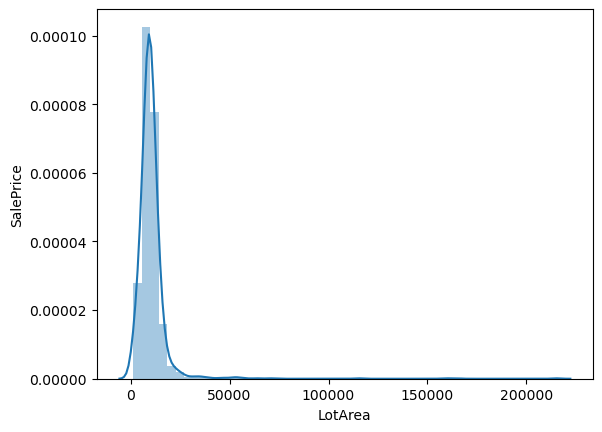

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


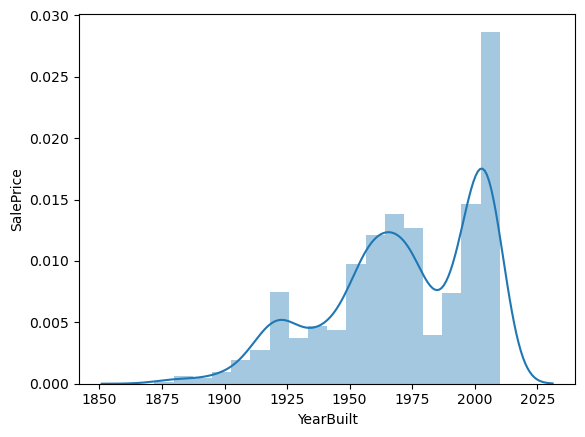

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


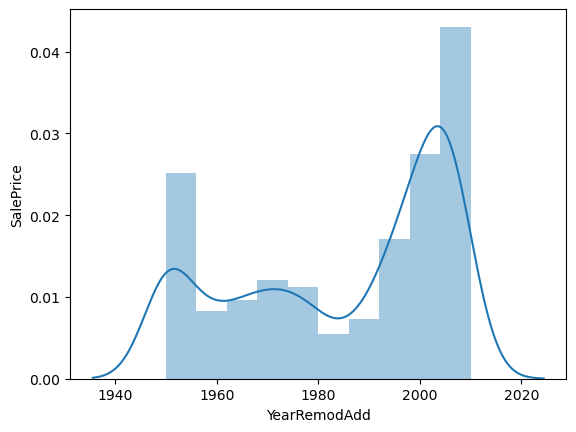

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


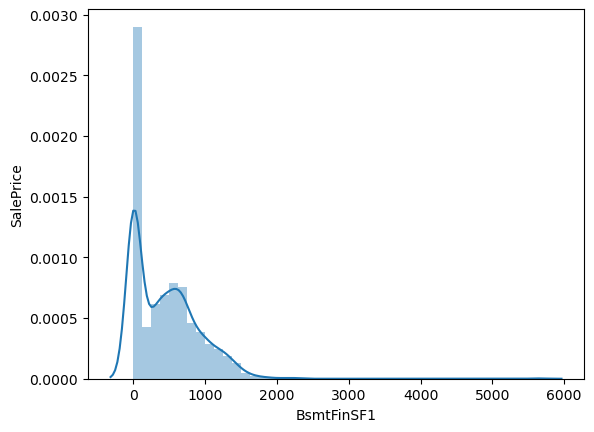

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


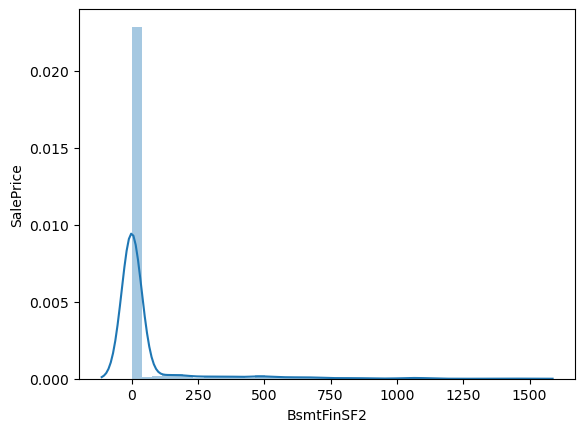

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


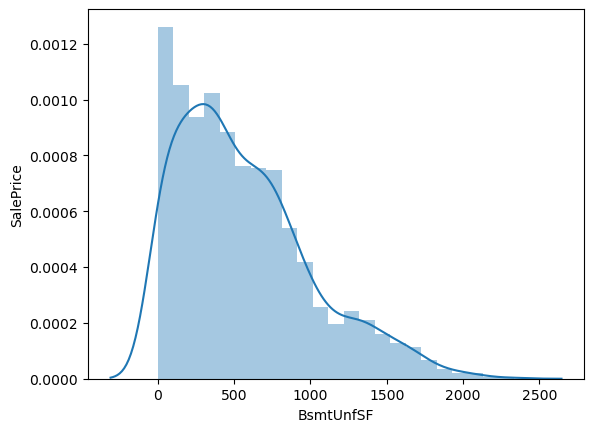

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


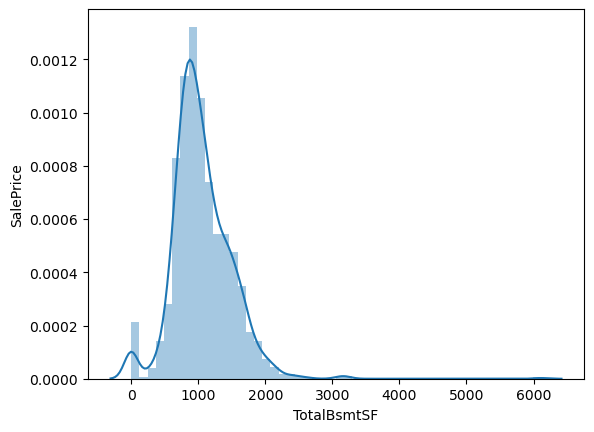

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


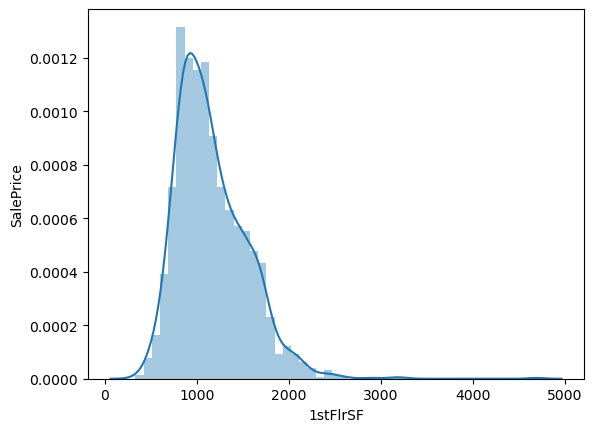

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


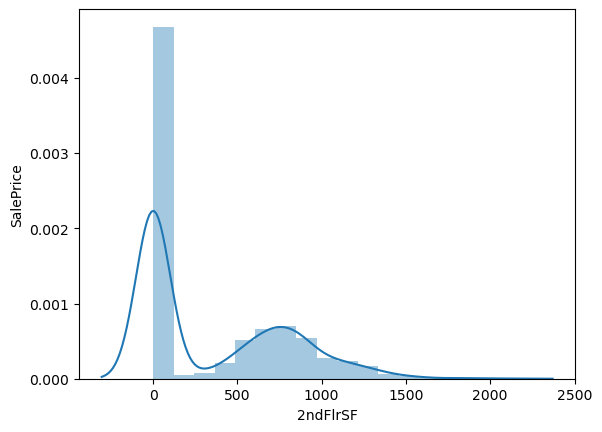

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


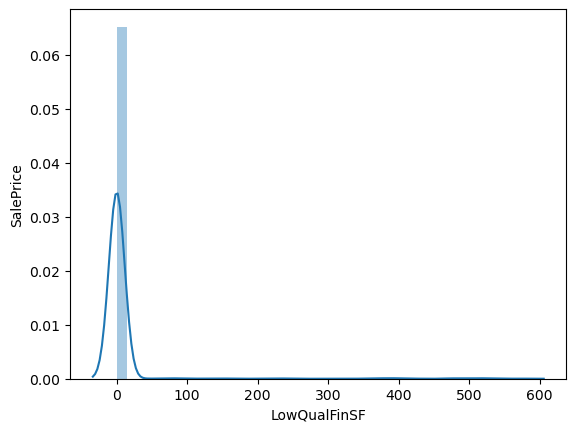

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


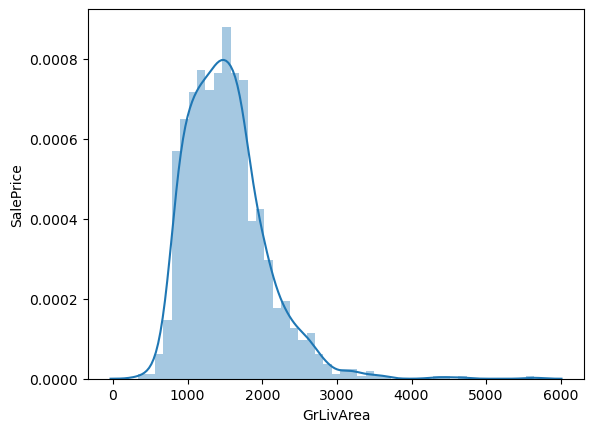

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


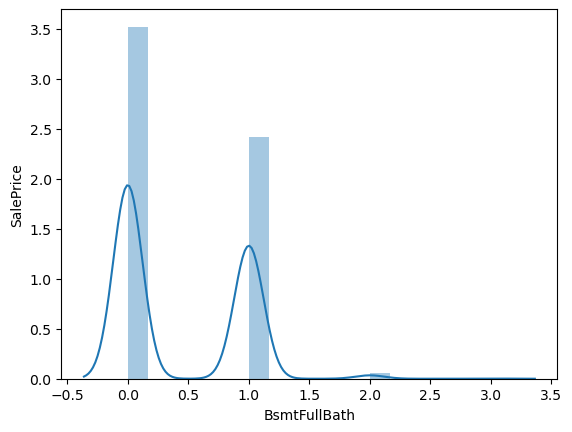

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


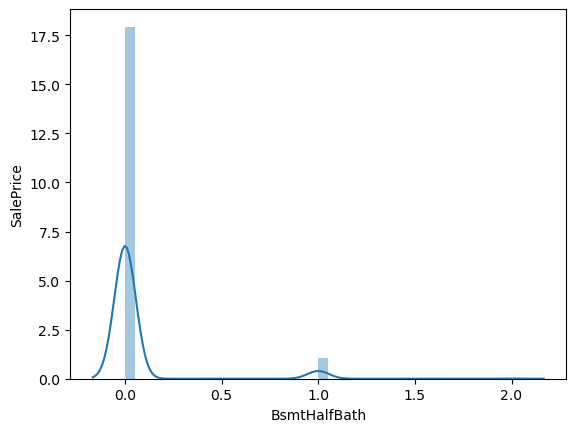

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


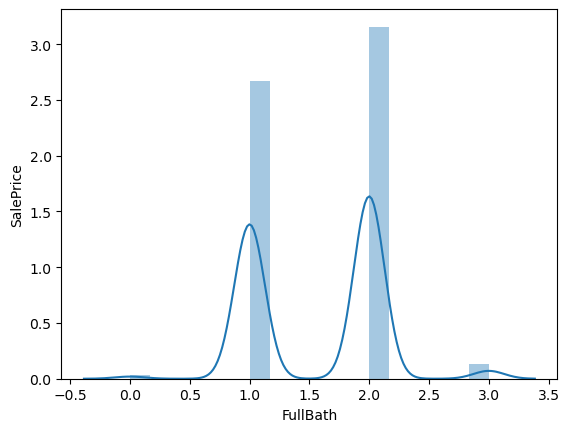

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


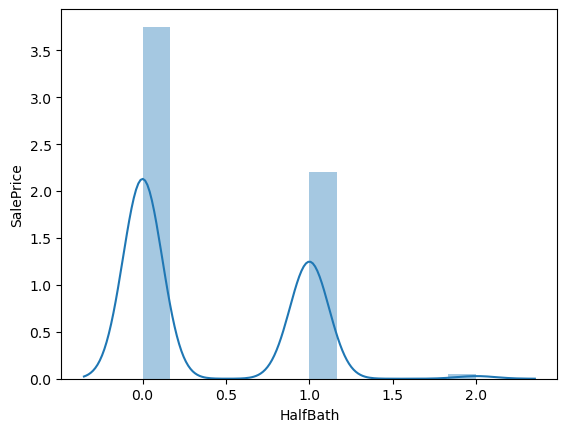

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


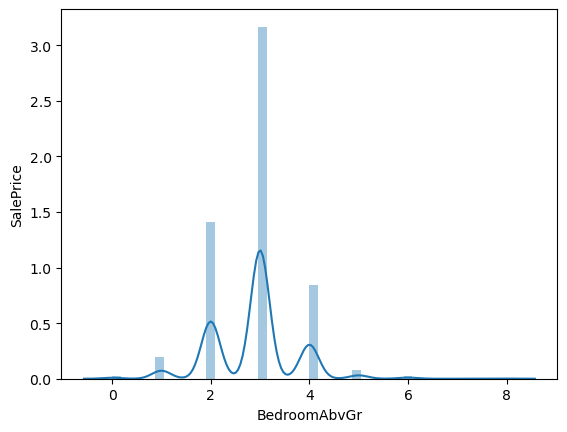

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


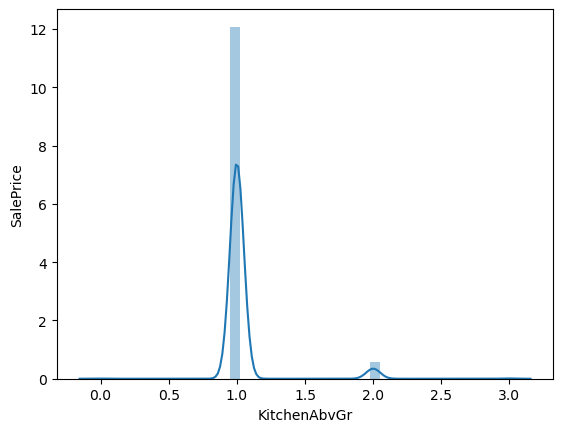

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


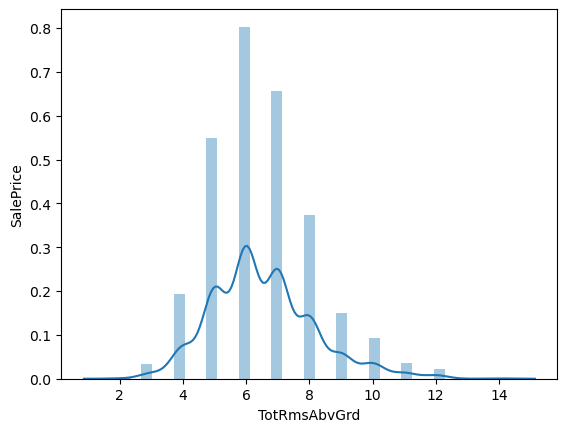

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


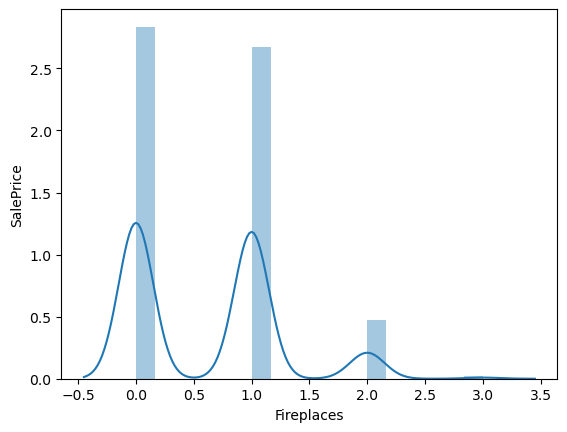

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


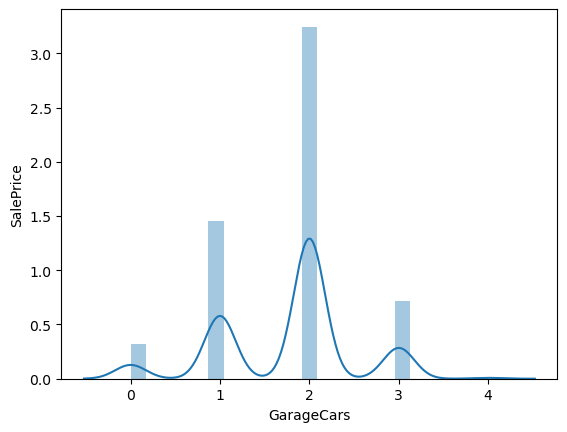

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


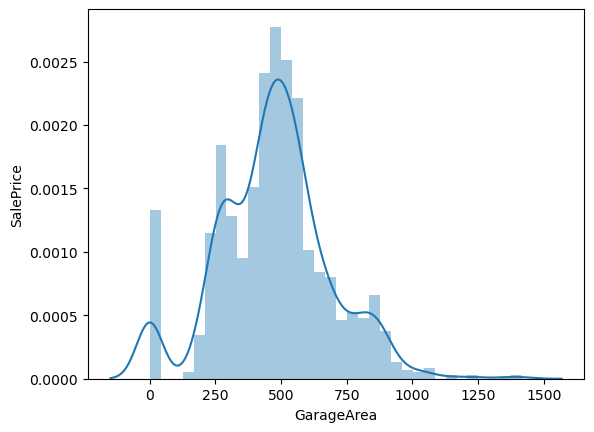

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


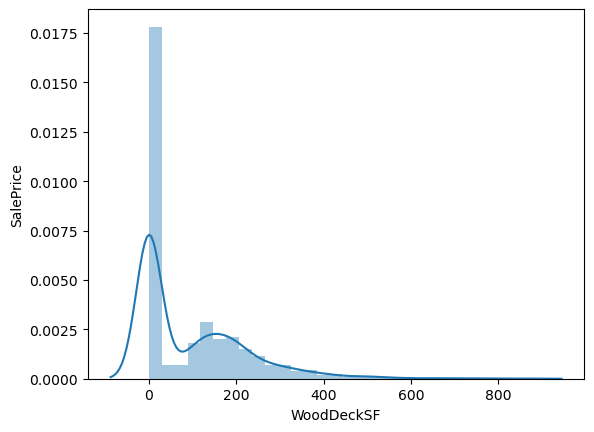

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


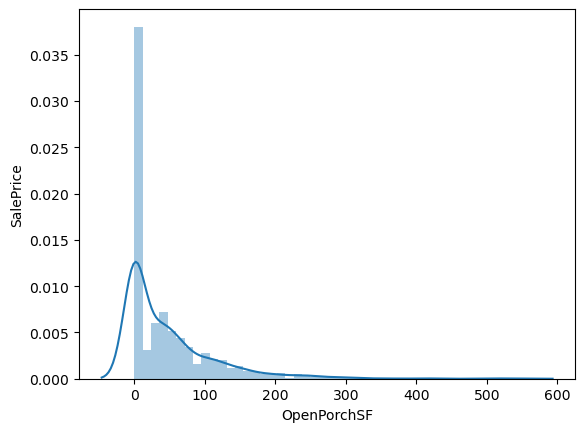

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


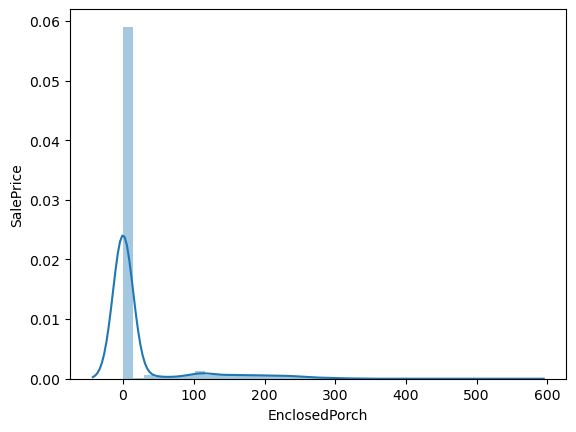

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


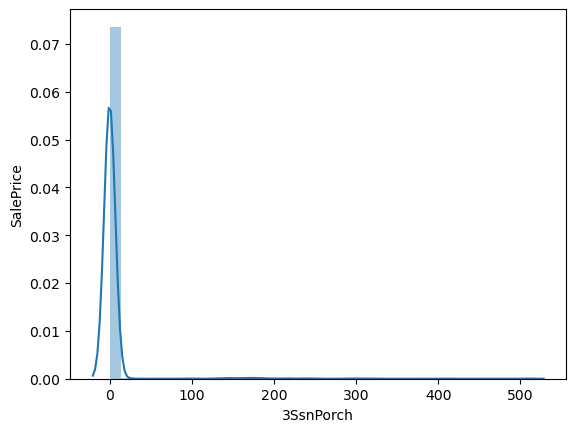

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


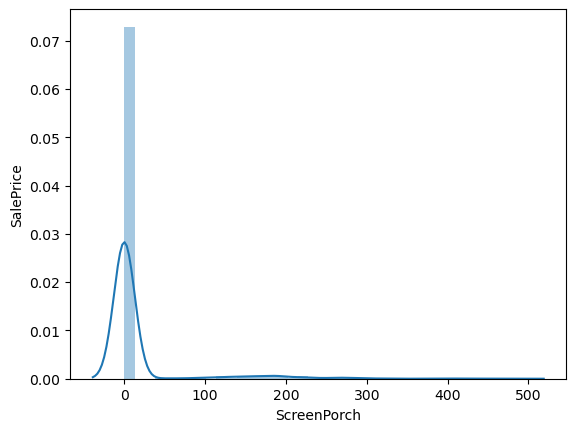

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


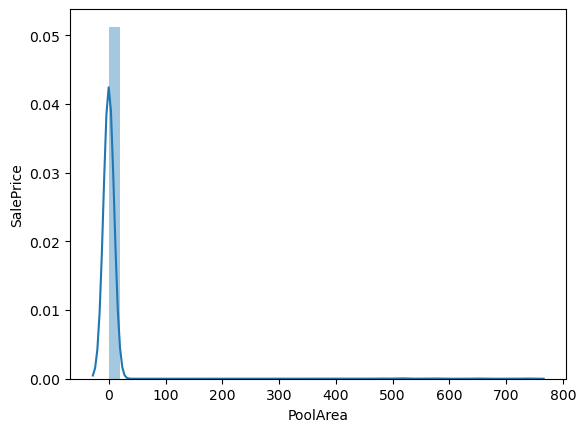

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


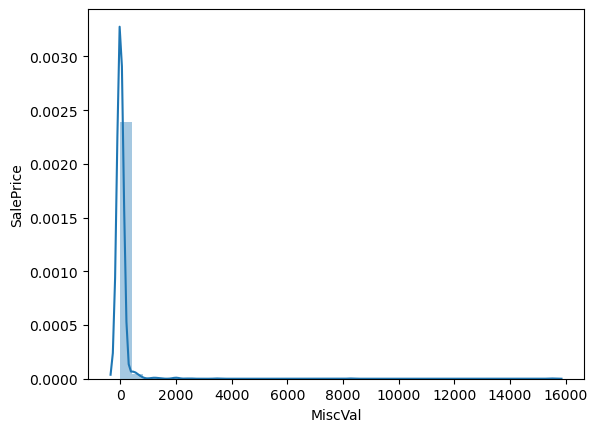

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


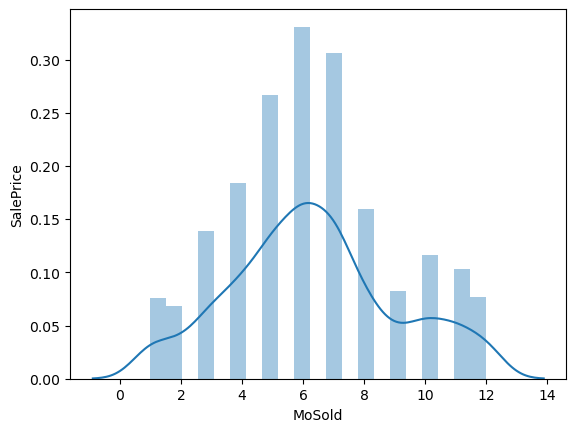

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


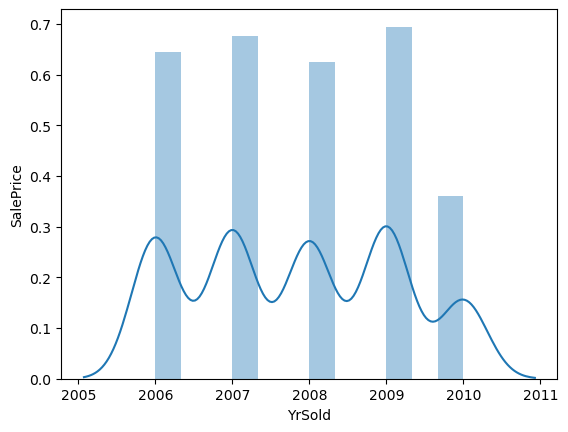

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\1325961988.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


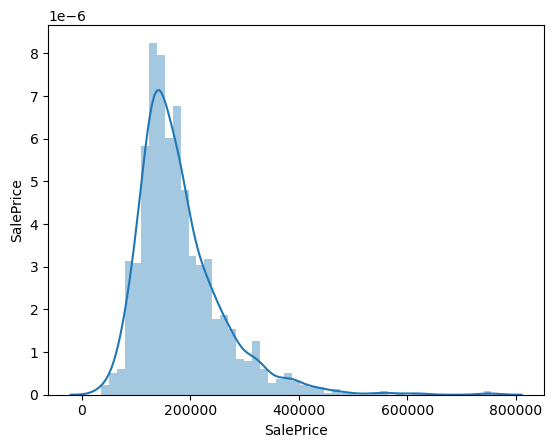

In [113]:
for i in cats_int:
    sns.distplot(x=df[i])
    plt.xlabel(i)
    plt.ylabel('SalePrice')
    plt.show()

In [39]:
cats_flt=[i for i in df.columns if df[i].dtypes=='float64']

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\3923736638.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


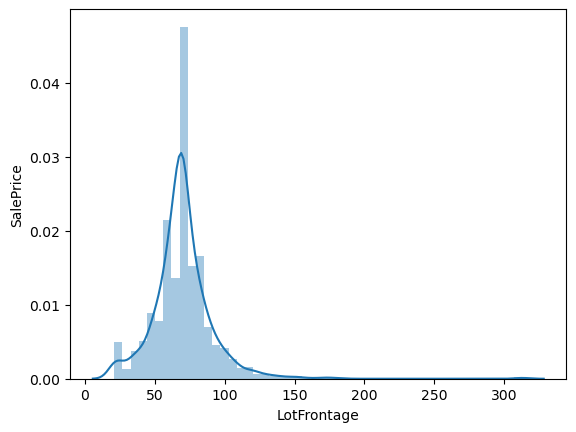

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\3923736638.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


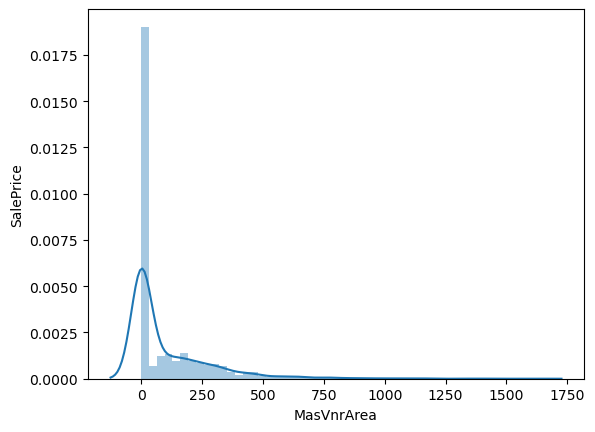

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13988\3923736638.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[i])


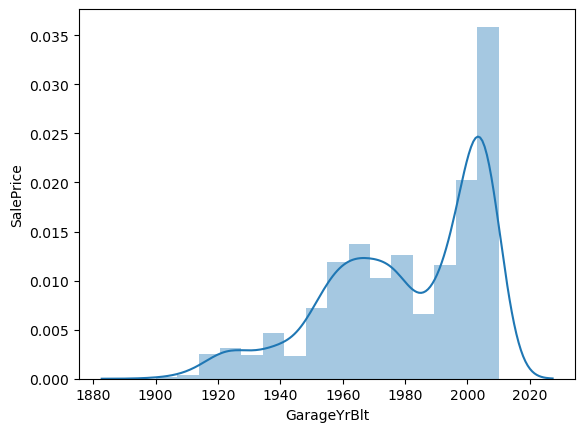

In [115]:
for i in cats_flt:
    sns.distplot(x=df[i])
    plt.xlabel(i)
    plt.ylabel('SalePrice')
    plt.show()

In [40]:
cats_num=[i for i in df.columns if df[i].dtypes=='int64' or df[i].dtypes=='float64']

<Axes: >

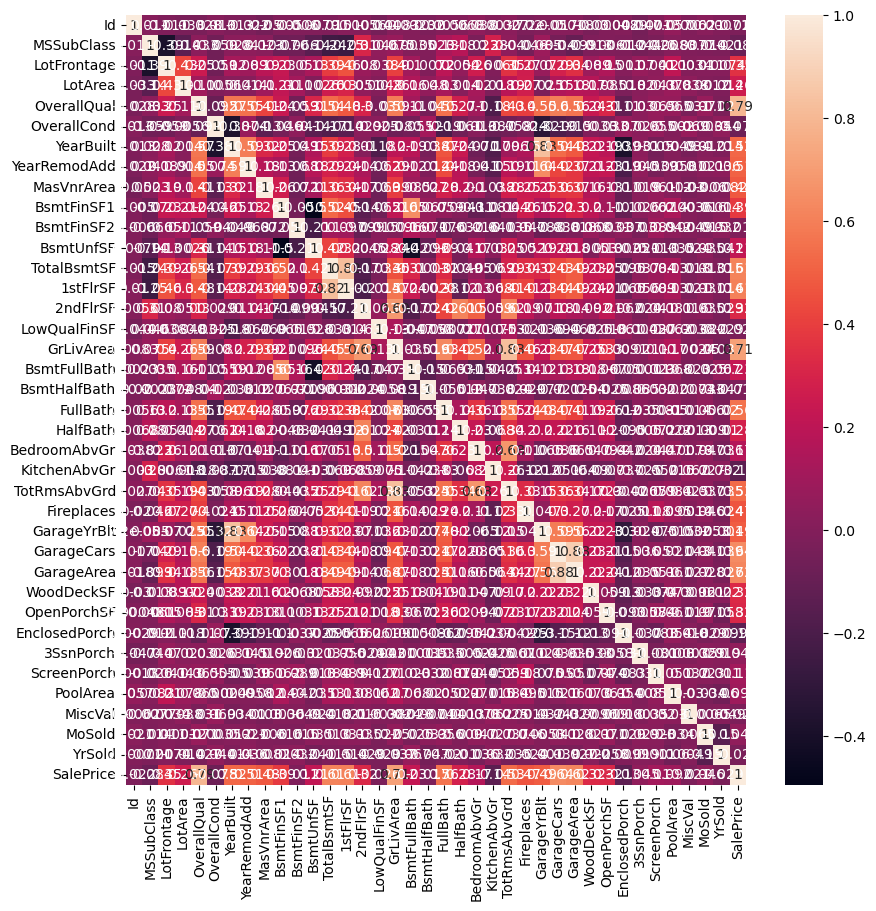

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,10)) 
sns.heatmap(df[cats_num].corr(),annot = True,ax=ax) 

In [54]:
df[cats_num].corr()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
LotFrontage,1.000000,0.304522,0.116685,0.083348,0.178469,0.214367,0.042463,0.124098,0.363472,0.413773,0.072388,0.037469,0.368007,0.090343,-0.006979,0.180534,0.047222,0.236840,-0.004905,0.320518,0.233221,0.038892,0.269539,0.323511,0.075542,0.137014,0.010287,0.061945,0.037655,0.180819,-0.000255,0.010451,0.006380,0.334771
LotArea,0.304522,1.000000,0.014228,0.013788,0.103321,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,0.271364,-0.042198,0.154871,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
YearBuilt,0.116685,0.014228,1.000000,0.592855,0.311600,0.249503,-0.049107,0.149040,0.391452,0.281986,0.010308,-0.183784,0.199010,0.187599,-0.038162,0.468271,0.242656,-0.070651,-0.174800,0.095589,0.147716,0.700098,0.537850,0.478954,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,0.083348,0.013788,0.592855,1.000000,0.176529,0.128451,-0.067759,0.181133,0.291066,0.240379,0.140024,-0.062419,0.287389,0.119470,-0.012337,0.439046,0.183331,-0.040581,-0.149598,0.191740,0.112581,0.571369,0.420622,0.371600,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,0.178469,0.103321,0.311600,0.176529,1.000000,0.261256,-0.071330,0.113862,0.360067,0.339850,0.173800,-0.068628,0.388052,0.083010,0.027403,0.272999,0.199108,0.102775,-0.038450,0.279568,0.247015,0.209289,0.361945,0.370884,0.159991,0.122528,-0.109907,0.019144,0.062248,0.011928,-0.029512,-0.006723,-0.008317,0.472614
BsmtFinSF1,0.214367,0.214103,0.249503,0.128451,0.261256,1.000000,-0.050117,-0.495251,0.522396,0.445863,-0.137079,-0.064503,0.208171,0.649212,0.067418,0.058543,0.004262,-0.107355,-0.081007,0.044316,0.260011,0.119267,0.224054,0.296970,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420
BsmtFinSF2,0.042463,0.111170,-0.049107,-0.067759,-0.071330,-0.050117,1.000000,-0.209294,0.104810,0.097117,-0.099260,0.014807,-0.009640,0.158678,0.070948,-0.076444,-0.032148,-0.015728,-0.040751,-0.035227,0.046921,-0.094208,-0.038264,-0.018227,0.067898,0.003093,0.036543,-0.029993,0.088871,0.041709,0.004940,-0.015211,0.031706,-0.011378
BsmtUnfSF,0.124098,-0.002618,0.149040,0.181133,0.113862,-0.495251,-0.209294,1.000000,0.415360,0.317987,0.004469,0.028167,0.240257,-0.422900,-0.095804,0.288886,-0.041118,0.166643,0.030086,0.250647,0.051575,0.172350,0.214175,0.183303,-0.005316,0.129005,-0.002538,0.020764,-0.012579,-0.035092,-0.023837,0.034888,-0.041258,0.214479
TotalBsmtSF,0.363472,0.260833,0.391452,0.291066,0.360067,0.522396,0.104810,0.415360,1.000000,0.819530,-0.174512,-0.033245,0.454868,0.307351,-0.000315,0.323722,-0.048804,0.050450,-0.068901,0.285573,0.339519,0.262945,0.434585,0.486665,0.232019,0.247264,-0.095478,0.037384,0.084489,0.126053,-0.018479,0.013196,-0.014969,0.613581
1stFlrSF,0.413773,0.299475,0.281986,0.240379,0.339850,0.445863,0.097117,0.317987,0.819530,1.000000,-0.202646,-0.014241,0.566024,0.244671,0.001956,0.380637,-0.119916,0.127401,0.068101,0.409516,0.410531,0.182240,0.439317,0.489782,0.235459,0.211671,-0.065292,0.056104,0.088758,0.131525,-0.021096,0.031372,-0.013604,0.605852


In [55]:
# Above data shows that the target variable 'SalePrice' is linearly related to some dependent variables.

In [56]:
sns.pairplot(df[cats_num])
plt.show()

C:\Users\Joseph\AppData\Local\Temp\ipykernel_13760\1611146993.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


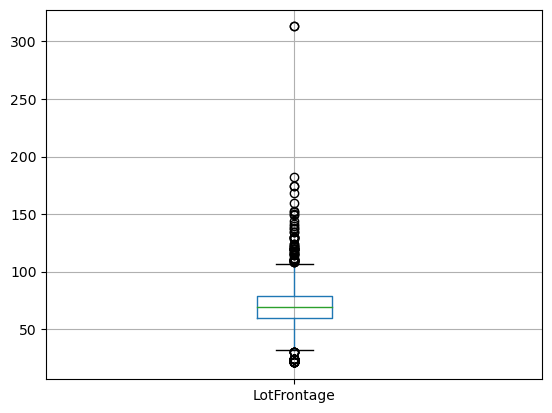

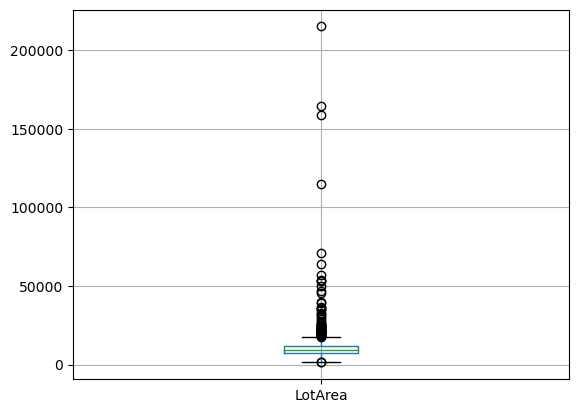

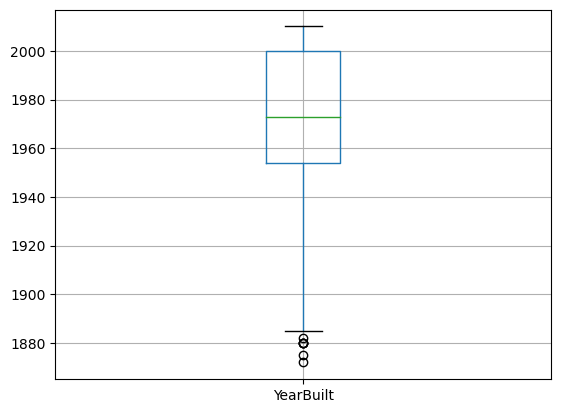

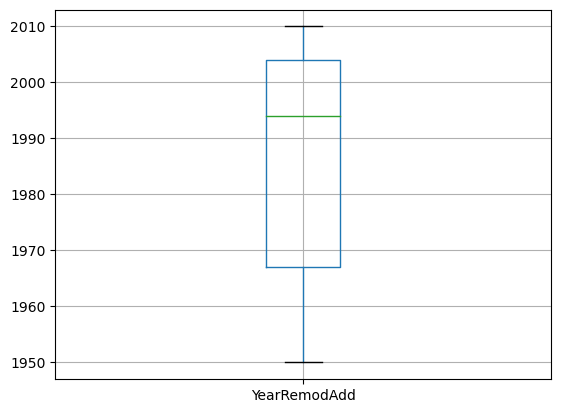

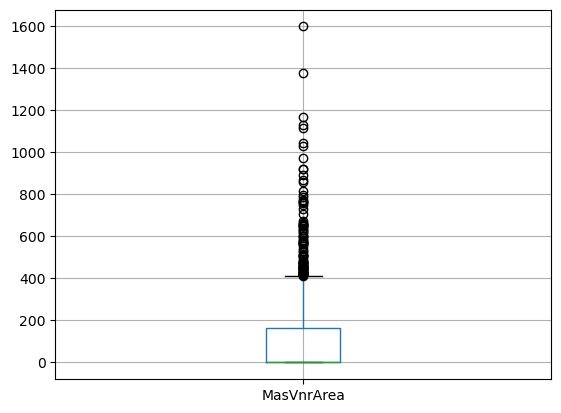

...

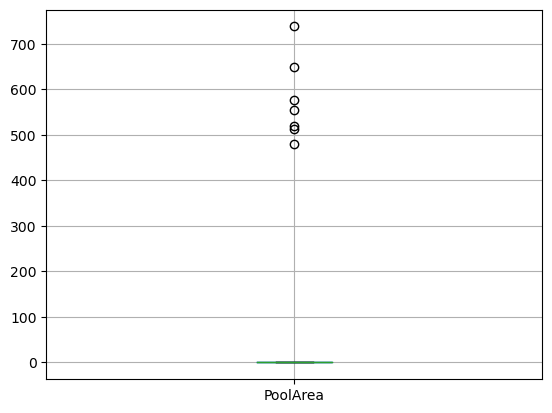

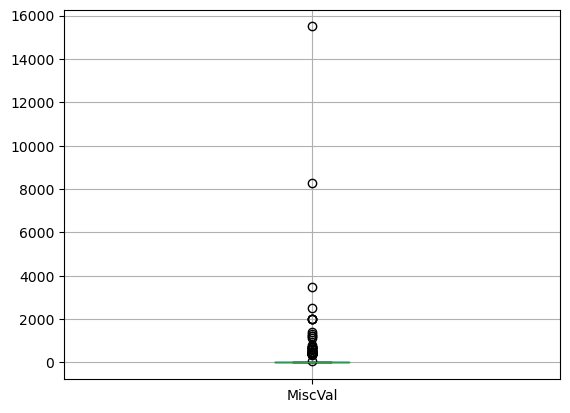

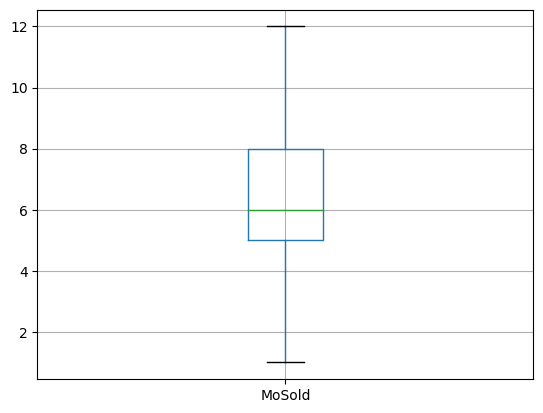

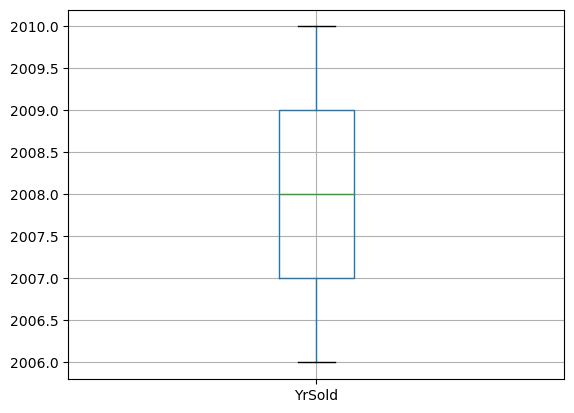

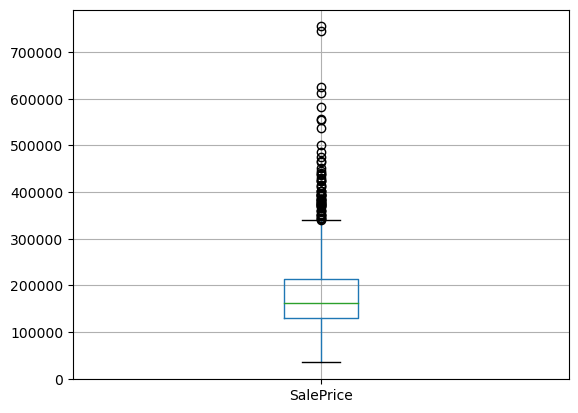

In [433]:
for cats_nums in cats_num:
    plt.figure()
    df.boxplot(column=cats_nums)
    



In [235]:
# There are many outliers also in the dataset.We treat them by capping to 0.90 quantile value of the train dataset.

In [41]:
df_train, df_test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = 100)
df.SalePrice.clip(upper = df_train.SalePrice.quantile(0.90), inplace=True)

<Axes: >

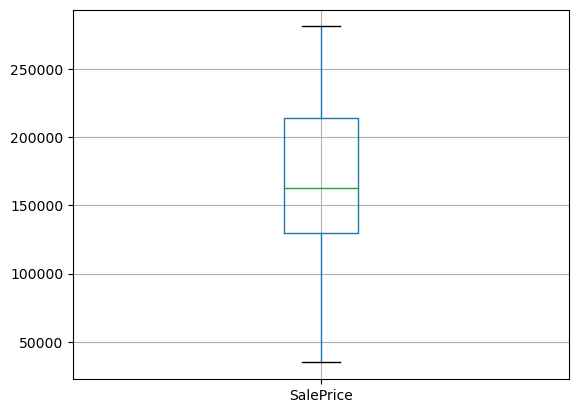

In [42]:
plt.figure()
df.boxplot(column='SalePrice')

In [43]:
cats_num=[i for i in df.columns if df[i].dtypes=='int64' or df[i].dtypes=='float64']

In [44]:
df[cats_num]

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,65.0,8450,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003,2,548,0,61,0,0,0,0,0,2,2008,208500
1,80.0,9600,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976,2,460,298,0,0,0,0,0,0,5,2007,181500
2,68.0,11250,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001,2,608,0,42,0,0,0,0,0,9,2008,223500
3,60.0,9550,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998,3,642,0,35,272,0,0,0,0,2,2006,140000
4,84.0,14260,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000,3,836,192,84,0,0,0,0,0,12,2008,250000
5,85.0,14115,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993,2,480,40,30,0,320,0,0,700,10,2009,143000
6,75.0,10084,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004,2,636,255,57,0,0,0,0,0,8,2007,281000
7,69.0,10382,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973,2,484,235,204,228,0,0,0,350,11,2009,200000
8,51.0,6120,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931,2,468,90,0,205,0,0,0,0,4,2008,129900
9,50.0,7420,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939,1,205,0,4,0,0,0,0,0,1,2008,118000


In [45]:
#  Since most of the int and float variables are skewed, we have to do log transformation. Since there are values between 0 and 1,  we have to do transfomation as log(x+1)

In [46]:
df[cats_num] = df[cats_num].apply(lambda x: np.log(x+1))

In [47]:
df[cats_num]

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,4.189655,9.042040,7.602900,7.602900,5.283204,6.561031,0.000000,5.017280,6.753438,6.753438,6.751101,0.000000,7.444833,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,2.197225,0.000000,7.602900,1.098612,6.308098,0.000000,4.127134,0.000000,0.000000,0.000000,0.000000,0.000000,1.098612,7.605392,12.247699
1,4.394449,9.169623,7.589336,7.589336,0.000000,6.886532,0.000000,5.652489,7.141245,7.141245,0.000000,0.000000,7.141245,0.000000,0.693147,1.098612,0.000000,1.386294,0.693147,1.945910,0.693147,7.589336,1.098612,6.133398,5.700444,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.791759,7.604894,12.109016
2,4.234107,9.328212,7.601902,7.602401,5.093750,6.188264,0.000000,6.075346,6.825460,6.825460,6.765039,0.000000,7.488294,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,1.945910,0.693147,7.601902,1.098612,6.411818,0.000000,3.761200,0.000000,0.000000,0.000000,0.000000,0.000000,2.302585,7.605392,12.317171
3,4.110874,9.164401,7.557995,7.586296,0.000000,5.379897,0.000000,6.293419,6.629363,6.869014,6.629363,0.000000,7.448916,0.693147,0.000000,0.693147,0.000000,1.386294,0.693147,2.079442,0.693147,7.600402,1.386294,6.466145,0.000000,3.583519,5.609472,0.000000,0.000000,0.000000,0.000000,1.098612,7.604396,11.849405
4,4.442651,9.565284,7.601402,7.601402,5.860786,6.486161,0.000000,6.196444,7.044033,7.044033,6.960348,0.000000,7.695758,0.693147,0.000000,1.098612,0.693147,1.609438,0.693147,2.302585,0.693147,7.601402,1.386294,6.729824,5.262690,4.442651,0.000000,0.000000,0.000000,0.000000,0.000000,2.564949,7.605392,12.429220
5,4.454347,9.555064,7.597898,7.598900,0.000000,6.597146,0.000000,4.174387,6.680855,6.680855,6.340359,0.000000,7.217443,0.693147,0.000000,0.693147,0.693147,0.693147,0.693147,1.791759,0.000000,7.597898,1.098612,6.175867,3.713572,3.433987,0.000000,5.771441,0.000000,0.000000,6.552508,2.397895,7.605890,11.870607
6,4.330733,9.218804,7.603399,7.603898,5.231109,7.222566,0.000000,5.762051,7.430707,7.435438,0.000000,0.000000,7.435438,0.693147,0.000000,1.098612,0.000000,1.386294,0.693147,2.079442,0.693147,7.603399,1.098612,6.456770,5.545177,4.060443,0.000000,0.000000,0.000000,0.000000,0.000000,2.197225,7.604894,12.546114
7,4.248495,9.247925,7.587817,7.587817,5.484797,6.756932,3.496508,5.379897,7.010312,7.010312,6.891626,0.000000,7.645398,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,2.079442,1.098612,7.587817,1.098612,6.184149,5.463832,5.323010,5.433722,0.000000,0.000000,0.000000,5.860786,2.484907,7.605890,12.206078
8,3.951244,8.719481,7.566311,7.576097,0.000000,0.000000,0.000000,6.859615,6.859615,6.930495,6.624065,0.000000,7.481556,0.000000,0.000000,1.098612,0.000000,1.098612,1.098612,2.197225,1.098612,7.566311,1.098612,6.150603,4.510860,0.000000,5.327876,0.000000,0.000000,0.000000,0.000000,1.609438,7.605392,11.774528
9,3.931826,8.912069,7.570443,7.576097,0.000000,6.747587,0.000000,4.948760,6.899723,6.982863,0.000000,0.000000,6.982863,0.693147,0.000000,0.693147,0.000000,1.098612,1.098612,1.791759,1.098612,7.570443,0.693147,5.327876,0.000000,1.609438,0.000000,0.000000,0.000000,0.000000,0.000000,0.693147,7.605392,11.678448


In [48]:
# Convert categorical variables to dummy variables
status=pd.get_dummies(data=df,columns=cats,drop_first=True)

In [49]:
status.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_No,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No,GarageQual_Po,GarageQual_TA,Garage

In [50]:
status.loc[209,:]

LotFrontage               4.330733
LotArea                   9.018090
YearBuilt                 7.583248
YearRemodAdd              7.583248
MasVnrArea                5.564520
BsmtFinSF1                6.669498
BsmtFinSF2                0.000000
BsmtUnfSF                 5.723585
TotalBsmtSF               6.996681
1stFlrSF                  6.996681
2ndFlrSF                  0.000000
LowQualFinSF              0.000000
GrLivArea                 6.996681
BsmtFullBath              0.693147
BsmtHalfBath              0.000000
FullBath                  0.693147
HalfBath                  0.000000
BedroomAbvGr              1.386294
KitchenAbvGr              0.693147
TotRmsAbvGrd              1.945910
Fireplaces                0.000000
GarageYrBlt               7.583248
GarageCars                1.098612
GarageArea                6.224558
WoodDeckSF                0.000000
OpenPorchSF               0.000000
EnclosedPorch             0.000000
3SsnPorch                 0.000000
ScreenPorch         

In [51]:
status.shape


(1460, 288)

In [52]:
df=status

In [53]:
# Split data to train and test data in the ratio 70/30

In [54]:
df_train, df_test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = 100)
print(df_train.shape)
print(df_test.shape)

(1021, 288)
(438, 288)


In [55]:
# Since there are many outliers as observed in the earlier plots, it is better to use Robustscaler for scaling the numeric values.

In [56]:
# Scaling the numeric variables using RobustScaler on the training data
scaler = RobustScaler()
df_train[cats_num] = scaler.fit_transform(df_train[cats_num])

In [57]:
df_train.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_No,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No,GarageQual_Po,GarageQual_TA,Garage

In [58]:
# Divide df_train to X train and Y train
y_train=df_train.pop('SalePrice')
X_train=df_train

In [59]:
# Model building

In [60]:
# Instantiate
lm = LinearRegression()

# Fit a line
lm.fit(X_train,y_train)

LinearRegression()

In [61]:
df_test[cats_num] = scaler.transform(df_test[cats_num])

In [62]:
df_test.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_No,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No,GarageQual_Po,GarageQual_TA,Garage

In [63]:
# Divide df_test to X test and Y test
y_test=df_test.pop('SalePrice')
X_test=df_test

In [64]:
from sklearn.metrics import r2_score, mean_squared_error

In [65]:
y_pred_train = lm.predict(X_train)
y_pred_test = lm.predict(X_test)

metric = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric.append(mse_test_lr**0.5)

0.9559480716442046
-2.704184110830259e+21
22.553824606442664
6.089784029160729e+23
0.022089935951461963
1.3903616504933172e+21


In [66]:
# the R2 score for test data is very low, hence going for regularization method

In [67]:
# Ridge regression

In [68]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.5, 1.0, 5.0, 10.0, 20.0, 50.0, 100.0 ]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 13 candidates, totalling 65 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.5,
                                   1.0, 5.0, 10.0, 20.0, 50.0, 100.0]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [69]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 10.0}


In [70]:
#Fitting Ridge model for alpha = 10 and printing coefficients which have been penalised
alpha = 1
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[ 4.19876537e-03  7.41435357e-02  1.75065929e-01  1.00507022e-01
 -2.69940336e-02  1.02955672e-01 -2.56040683e-03 -1.26943328e-02
  6.08893868e-02 -5.48126969e-02 -1.11048096e-01 -1.84488404e-02
  3.89419992e-01  4.08011704e-02 -3.09593149e-03  4.56527431e-02
  2.66263326e-02  6.67222745e-03 -2.89855313e-01  1.27827612e-03
 -3.58211987e-02 -9.67797109e-03  4.55749180e-02  3.47152943e-02
  4.12937406e-02  2.59894145e-02  3.91406049e-03  8.18617898e-04
  9.57029655e-03 -5.14121536e-02 -2.91753891e-05  1.63877881e-02
 -1.07343310e-02 -1.15189553e-01 -4.59879912e-02 -9.06407063e-02
 -3.40211420e-02 -1.19103292e-01  4.49053729e-02  1.12580144e-01
 -5.51835474e-02  2.93808349e-03 -2.28914340e-02  5.79691851e-02
 -1.58866342e-01  3.83557440e-02 -4.03414327e-02  4.10368870e-01
  3.68079797e-01  3.92069947e-01  3.35655345e-01  7.54520677e-02
  4.58710861e-02  1.24029815e-01 -1.00262461e-02 -4.59653684e-02
  2.30720396e-02  2.36613250e-02  9.19227869e-03  3.97193084e-02
 -1.14762932e-01  2.96494

In [71]:
# ridge model parameters
model_params = list(ridge.coef_)
model_params.insert(0, ridge.intercept_)
cols = X_train.columns
cols = cols.insert(0, "constant")
coff=list(zip(cols, model_params))
coff_df=pd.DataFrame(coff)
coff_df.columns=['Predictor','Coefficient']
coff_df.head()

,Predictor,Coefficient
0,constant,-0.938442
1,LotFrontage,0.004199
2,LotArea,0.074144
3,YearBuilt,0.175066
4,YearRemodAdd,0.100507


In [72]:
# Sort coefficients in descending order
coff_df=coff_df.sort_values(by=['Coefficient'],ascending=False)

In [73]:
coff_df

,Predictor,Coefficient
48,MSZoning_FV,0.410369
50,MSZoning_RL,0.392070
13,GrLivArea,0.389420
49,MSZoning_RH,0.368080
102,Condition2_PosA,0.340985
51,MSZoning_RM,0.335655
277,SaleType_ConLD,0.314521
134,OverallCond_9,0.232429
124,OverallQual_8,0.228666
125,OverallQual_9,0.209207


In [74]:
# Calculating the metrics

In [75]:
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.949415642387702
0.8566590008759134
25.898315283790527
32.28018845661346
0.025365636908707665
0.07369906040322707


In [76]:
# Lasso regression

In [77]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 13 candidates, totalling 65 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.5,
                                   1.0, 5.0, 10.0, 20.0, 50.0, 100.0]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [78]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 0.001}


In [79]:
#Fitting Lasso model for alpha = 0.001 and printing coefficients which have been penalised

alpha =0.001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 

Lasso(alpha=0.001)

In [80]:
lasso.coef_

array([ 4.14656782e-03,  5.98130621e-02,  1.64466703e-01,  1.10857308e-01,
        0.00000000e+00,  1.00692981e-01, -1.06464220e-04, -1.10865309e-02,
        2.15210146e-02,  0.00000000e+00, -7.96648741e-02, -1.63564828e-02,
        3.84854341e-01,  5.32422405e-02,  0.00000000e+00,  4.53746326e-02,
        1.76866344e-02, -0.00000000e+00, -2.10662447e-01,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  6.60830887e-02,  1.46822730e-03,
        4.43615130e-02,  1.59216129e-02,  5.21261538e-03,  0.00000000e+00,
        1.07763297e-02, -5.71776143e-02, -4.43294030e-03,  9.61504126e-03,
       -1.19321270e-02, -1.39714003e-01, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00, -4.32310210e-02,  6.03146239e-02,  4.62676421e-02,
       -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,  1.37757639e-02,
       -8.53532751e-02, -0.00000000e+00, -0.00000000e+00,  4.42603437e-02,
        4.59645264e-02,  7.55491011e-02,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  

In [81]:
# Lasso model parameters
model_params_lasso = list(lasso.coef_)
model_params_lasso.insert(0, lasso.intercept_)
cols_lasso = X_train.columns
cols_lasso = cols_lasso.insert(0, "constant")
coff_lasso=list(zip(cols_lasso, model_params_lasso))
coff_df_lasso=pd.DataFrame(coff_lasso)
coff_df_lasso.columns=['Predictor','Coefficient']
coff_df_lasso.head()

,Predictor,Coefficient
0,constant,-0.434532
1,LotFrontage,0.004147
2,LotArea,0.059813
3,YearBuilt,0.164467
4,YearRemodAdd,0.110857


In [82]:
# Sort Lasso regression coefficients in descending order
coff_df_lasso=coff_df_lasso.sort_values(by=['Coefficient'],ascending=False)
coff_df_lasso

,Predictor,Coefficient
13,GrLivArea,0.384854
124,OverallQual_8,0.284118
125,OverallQual_9,0.282309
88,Neighborhood_Somerst,0.175325
73,Neighborhood_Crawfor,0.169634
3,YearBuilt,0.164467
71,Neighborhood_ClearCr,0.162179
123,OverallQual_7,0.146600
134,OverallCond_9,0.145029
237,Functional_Typ,0.133534


In [83]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9291360930879773
0.862883668407248
36.28109340668118
30.878402211093444
0.03553486131898255
0.07049863518514485


In [84]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),9.559481e-01,0.949416,0.929136
1,R2 Score (Test),-2.704184e+21,0.856659,0.862884
2,RSS (Train),2.255382e+01,25.898315,36.281093
3,RSS (Test),6.089784e+23,32.280188,30.878402
4,MSE (Train),1.486268e-01,0.159266,0.188507
5,MSE (Test),3.728755e+10,0.271476,0.265516


In [85]:
# The optimal value of alpha in Ridge regression is 10.0 and the optimal value of alpha in Lasso regression is 0.001.

In [86]:
# On doubling the alpha value of Ridge regression to 20.0:

In [284]:
#Fitting Ridge model for alpha = 20 and printing coefficients which have been penalised
alpha = 20
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[ 0.00760619  0.06680218  0.10990563  0.1153995   0.00358331  0.06047993
 -0.00263886 -0.01560424  0.03601211  0.06268071  0.0080767  -0.00646443
  0.25493763  0.04571264  0.00959396  0.06060044  0.04044818  0.00819628
 -0.05816399  0.02205058  0.02060687  0.01127772  0.05909447  0.01080668
  0.03907626  0.02389407  0.00261484  0.00313883  0.01061014 -0.06969527
 -0.00372593  0.01500743 -0.01281721 -0.11538318 -0.00688231  0.01031352
 -0.01122878 -0.05376947  0.0825316   0.05535131 -0.01881759  0.01191741
 -0.02660174  0.03079219 -0.05033973 -0.01274549 -0.02584382  0.08200875
  0.0415041   0.07684945  0.00891648  0.02252778  0.00994467  0.05875994
  0.0098361  -0.04204131  0.01132872  0.02808855  0.01850611  0.02970563
 -0.01096257  0.04033826 -0.04501569 -0.00591715 -0.00825626  0.01146873
 -0.01001869  0.00273006  0.00677411  0.06098788  0.08693366 -0.0138517
  0.11405678 -0.1168088  -0.03382343 -0.09634651 -0.05747681 -0.02940297
 -0.00963157  0.00265585 -0.01882449 -0.00475204  0.

In [285]:
# ridge model parameters
model_params = list(ridge.coef_)
model_params.insert(0, ridge.intercept_)
cols = X_train.columns
cols = cols.insert(0, "constant")
coff=list(zip(cols, model_params))
coff_df=pd.DataFrame(coff)
coff_df.columns=['Predictor','Coefficient']
coff_df.head()

,Predictor,Coefficient
0,constant,-0.462495
1,LotFrontage,0.007606
2,LotArea,0.066802
3,YearBuilt,0.109906
4,YearRemodAdd,0.115400


In [286]:
# Sort coefficients in descending order
coff_df=coff_df.sort_values(by=['Coefficient'],ascending=False)
coff_df

,Predictor,Coefficient
13,GrLivArea,0.254938
124,OverallQual_8,0.171041
4,YearRemodAdd,0.115400
73,Neighborhood_Crawfor,0.114057
88,Neighborhood_Somerst,0.112555
125,OverallQual_9,0.110612
224,CentralAir_Y,0.110196
3,YearBuilt,0.109906
237,Functional_Typ,0.108422
132,OverallCond_7,0.097408


In [287]:
# Calculating the mterics
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.9259430507089407
0.8661530528078624
37.915875820655906
30.142141509452976
0.03713601941298326
0.06881767467911638


In [288]:
#Fitting Ridge model for alpha = 0.002 and printing coefficients which have been penalised

alpha =0.002

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 

Lasso(alpha=0.002)

In [289]:
lasso.coef_

array([ 3.98102967e-03,  6.53895879e-02,  1.60768455e-01,  1.30752840e-01,
        0.00000000e+00,  9.77366827e-02, -9.14892808e-04, -1.06960942e-02,
        2.47763880e-02,  1.36480948e-02, -5.15136106e-02, -1.09824520e-02,
        3.62724737e-01,  4.83980662e-02,  0.00000000e+00,  3.08046535e-02,
        0.00000000e+00, -0.00000000e+00, -1.95684407e-02, -0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  6.34799206e-02,  5.33165415e-03,
        4.13992766e-02,  1.53600447e-02,  4.06140018e-03,  0.00000000e+00,
        1.15504798e-02, -6.86342761e-02, -6.30470562e-03,  8.31821866e-03,
       -1.04690030e-02, -1.26224290e-01, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -2.36367625e-03,  6.20061221e-02,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,  9.54079684e-03,
       -2.03716954e-04, -0.00000000e+00, -0.00000000e+00,  5.28526696e-03,
        0.00000000e+00,  6.37506046e-02, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  

In [290]:
# Lasso model parameters
model_params_lasso = list(lasso.coef_)
model_params_lasso.insert(0, lasso.intercept_)
cols_lasso = X_train.columns
cols_lasso = cols_lasso.insert(0, "constant")
coff_lasso=list(zip(cols_lasso, model_params_lasso))
coff_df_lasso=pd.DataFrame(coff_lasso)
coff_df_lasso.columns=['Predictor','Coefficient']
coff_df_lasso.head()

,Predictor,Coefficient
0,constant,-0.307199
1,LotFrontage,0.003981
2,LotArea,0.065390
3,YearBuilt,0.160768
4,YearRemodAdd,0.130753


In [291]:
# Sort Lasso regression coefficients in descending order
coff_df_lasso=coff_df_lasso.sort_values(by=['Coefficient'],ascending=False)
coff_df_lasso

,Predictor,Coefficient
13,GrLivArea,0.362725
124,OverallQual_8,0.276652
125,OverallQual_9,0.241601
88,Neighborhood_Somerst,0.176375
3,YearBuilt,0.160768
73,Neighborhood_Crawfor,0.148211
123,OverallQual_7,0.143481
237,Functional_Typ,0.137673
4,YearRemodAdd,0.130753
224,CentralAir_Y,0.121292


In [292]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9168713690996029
0.8652021935712688
42.560419738234025
30.356273652667493
0.04168503402373558
0.06930656085083903


In [87]:
X_train_drop=X_train.drop(['GrLivArea','OverallQual_8','Neighborhood_Somerst','YearBuilt', 'OverallQual_9'],axis=1)

In [88]:
X_test_drop=X_test.drop(['GrLivArea','OverallQual_8','Neighborhood_Somerst','YearBuilt', 'OverallQual_9'],axis=1)

In [89]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.5, 1.0, 5.0, 10.0, 20.0, 50.0, 100.0 ]}

ridge = Lasso()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train_drop, y_train) 

Fitting 5 folds for each of 13 candidates, totalling 65 fits


GridSearchCV(cv=5, estimator=Lasso(alpha=0.001),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.5,
                                   1.0, 5.0, 10.0, 20.0, 50.0, 100.0]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [90]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 0.0001}


In [91]:
#Fitting Lasso model for alpha = 0.0001 and printing coefficients which have been penalised

alpha =0.0001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_drop, y_train) 

Lasso(alpha=0.0001)

In [92]:
lasso.coef_

array([ 6.46268353e-03,  7.93534024e-02,  1.24398275e-01,  1.32650800e-02,
        1.11954215e-01,  1.51617660e-03, -1.34822957e-02,  1.00619585e-01,
        2.23316072e-01,  2.39547898e-01,  1.41090377e-02,  3.33813171e-02,
        0.00000000e+00,  7.48396869e-02,  6.00294408e-02,  9.60755073e-03,
       -4.00769538e-01,  3.35275554e-02, -1.15998512e-02,  1.85225098e-02,
        3.91170204e-02,  4.08744670e-02,  3.54725074e-02,  2.77453342e-02,
        1.75094713e-03, -0.00000000e+00,  9.15963037e-03, -5.68826901e-03,
       -3.17856087e-03,  1.95749417e-02, -6.46900075e-03, -2.44390441e-01,
       -8.90177365e-02, -1.94677505e-01, -6.06517639e-02, -6.30201546e-02,
        0.00000000e+00, -1.50169383e-02, -4.17629867e-02,  2.87587404e-02,
        0.00000000e+00,  4.82887907e-02, -9.34362594e-02,  6.51746319e-02,
       -1.11196043e-01,  8.80797464e-01,  7.51471082e-01,  7.33776659e-01,
        6.60864081e-01,  1.01039441e-01,  6.90748031e-02,  1.46695407e-01,
       -2.62121188e-02,  

In [93]:
# Lasso model parameters
model_params_lasso = list(lasso.coef_)
model_params_lasso.insert(0, lasso.intercept_)
cols_lasso = X_train_drop.columns
cols_lasso = cols_lasso.insert(0, "constant")
coff_lasso=list(zip(cols_lasso, model_params_lasso))
coff_df_lasso=pd.DataFrame(coff_lasso)
coff_df_lasso.columns=['Predictor','Coefficient']
coff_df_lasso.head()

,Predictor,Coefficient
0,constant,-1.207528
1,LotFrontage,0.006463
2,LotArea,0.079353
3,YearRemodAdd,0.124398
4,MasVnrArea,0.013265


In [94]:
# Sort Lasso regression coefficients in descending order
coff_df_lasso=coff_df_lasso.sort_values(by=['Coefficient'],ascending=False)
coff_df_lasso

,Predictor,Coefficient
189,BsmtQual_No,0.898294
46,MSZoning_FV,0.880797
47,MSZoning_RH,0.751471
48,MSZoning_RL,0.733777
49,MSZoning_RM,0.660864
99,Condition2_PosA,0.509469
272,SaleType_ConLD,0.500778
10,2ndFlrSF,0.239548
243,GarageType_No,0.225926
9,1stFlrSF,0.223316


In [95]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train_drop)
y_pred_test = lasso.predict(X_test_drop)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.948763257422849
0.7997759224893908
26.232325090451802
45.09017653769081
0.02569277677811146
0.10294560853354066
